# Crimes Data Analysis and Visualzation (EDA)

### Used Libraries
1. NumPy (Numerical Python)
2. Pandas
3. Matplotlib
4. Seaborn
5. Plotly
6. Missingno

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# visualization tools
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/crimes-in-boston/crime.csv
/kaggle/input/crimes-in-boston/offense_codes.csv


### Content:
1. Missingo - Missing Data
2. Seaborn - Count Plot
3. Seaborn - Bar Plot
4. Plotly - 2D Histograms
5. Plotly - Donut Chart
6. Plotly - Map Box
7. Word Cloud

### Reading Data

In [2]:
df=pd.read_csv("../input/crimes-in-boston/crime.csv",encoding = "ISO-8859-1")

In [3]:
df.sample(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
112483,I172058435,3106,Property Related Damage,PROPERTY - ACCIDENTAL DAMAGE,A1,64,NaN,2017-07-19 07:24:00,2017,7,Wednesday,7,Part Three,FRUIT ST,42.362403,-71.069547,"(42.36240281, -71.06954652)"
101681,I172069885,3119,Firearm Discovery,FIREARM/WEAPON - FOUND OR CONFISCATED,C11,355,NaN,2017-08-24 01:23:00,2017,8,Thursday,1,Part Three,DIX ST,42.295665,-71.058877,"(42.29566516, -71.05887655)"
262718,I162003594,3501,Missing Person Reported,MISSING PERSON,E13,579,NaN,2016-01-13 21:28:00,2016,1,Wednesday,21,Part Three,CENTRE ST,42.322914,-71.102690,"(42.32291389, -71.10268970)"
31943,I182036570,1402,Vandalism,VANDALISM,C11,402,NaN,2018-05-11 19:00:00,2018,5,Friday,19,Part Two,DORCHESTER AVE,42.284398,-71.064684,"(42.28439820, -71.06468373)"
16635,I182052853,3108,Fire Related Reports,"FIRE REPORT - HOUSE, BUILDING, ETC.",E13,508,NaN,2018-07-05 16:24:00,2018,7,Thursday,16,Part Three,PATTEN ST,42.294599,-71.116387,"(42.29459914, -71.11638657)"


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
INCIDENT_NUMBER        319073 non-null object
OFFENSE_CODE           319073 non-null int64
OFFENSE_CODE_GROUP     319073 non-null object
OFFENSE_DESCRIPTION    319073 non-null object
DISTRICT               317308 non-null object
REPORTING_AREA         319073 non-null object
SHOOTING               1019 non-null object
OCCURRED_ON_DATE       319073 non-null object
YEAR                   319073 non-null int64
MONTH                  319073 non-null int64
DAY_OF_WEEK            319073 non-null object
HOUR                   319073 non-null int64
UCR_PART               318983 non-null object
STREET                 308202 non-null object
Lat                    299074 non-null float64
Long                   299074 non-null float64
Location               319073 non-null object
dtypes: float64(2), int64(4), object(11)
memory usage: 41.4+ MB


In [5]:
df.isnull().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                 1765
REPORTING_AREA              0
SHOOTING               318054
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                   90
STREET                  10871
Lat                     19999
Long                    19999
Location                    0
dtype: int64

# Missingno - Missing Data

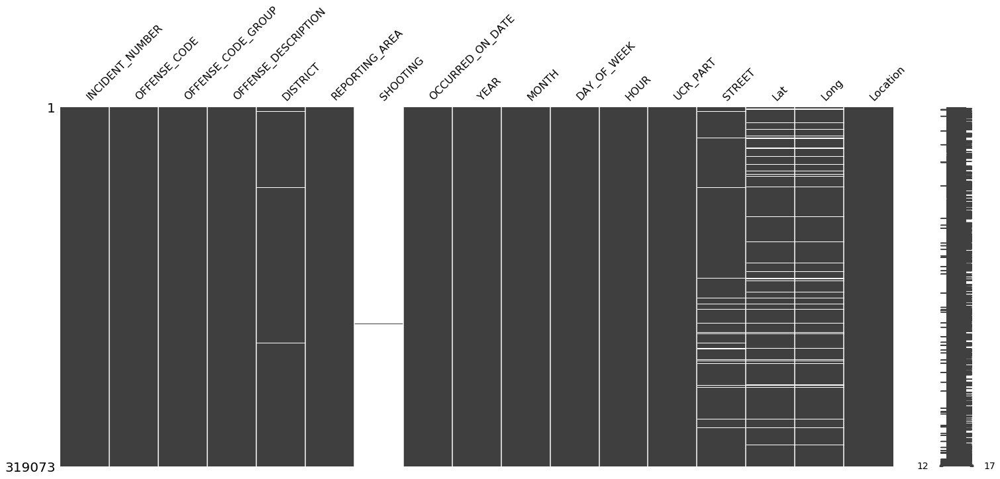

In [6]:
import missingno as msno
msno.matrix(df)
plt.show()

In [7]:
df.columns

Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'UCR_PART',
       'STREET', 'Lat', 'Long', 'Location'],
      dtype='object')

### Data Cleaning
Removed unnecessary

In [8]:
df.drop(columns=['INCIDENT_NUMBER','OFFENSE_CODE','SHOOTING'],inplace=True)

# Seaborn - Count Plot

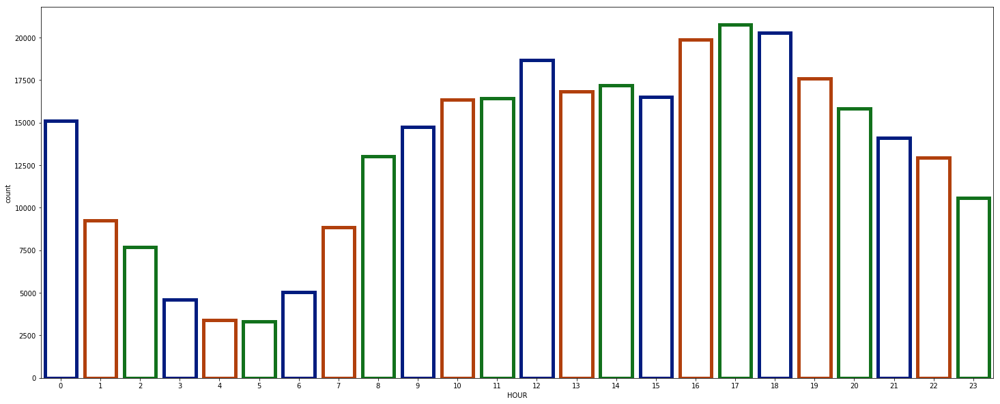

In [9]:
plt.figure(figsize=(25,10))
ax = sns.countplot(x="HOUR", data=df,
                   facecolor=(0, 0, 0, 0),
                   linewidth=5,
                   edgecolor=sns.color_palette("dark", 3))

# Seaborn - Bar Plot

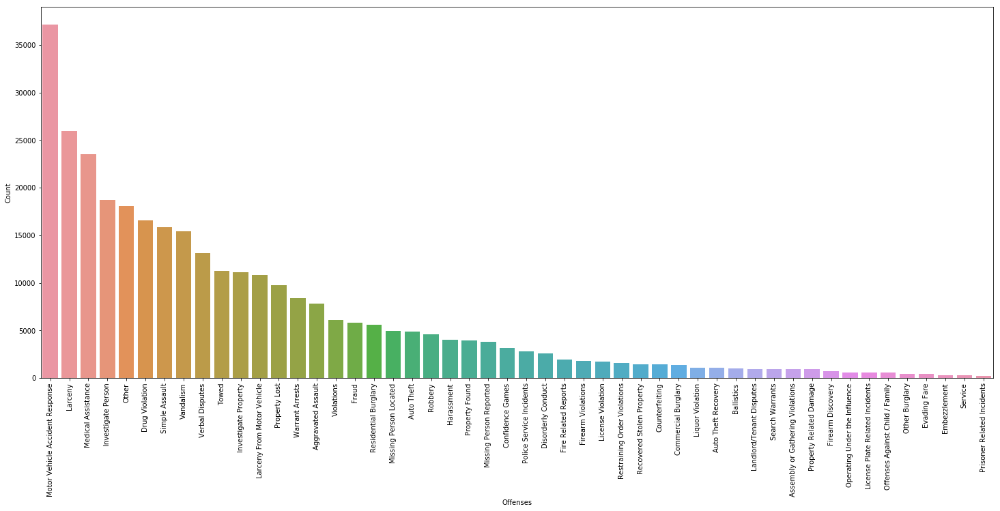

In [10]:
df2 = pd.DataFrame(columns = ['Offenses'])
df2["Offenses"]=[each for each in df.OFFENSE_CODE_GROUP.unique()]
df2["Count"]=[len(df[df.OFFENSE_CODE_GROUP==each]) for each in df2.Offenses]
df2=df2.sort_values(by=['Count'],ascending=False)

plt.figure(figsize=(25,10))
sns.barplot(x=df2.Offenses.head(50), y=df2.Count.head(50))
plt.xticks(rotation= 90)
plt.xlabel('Offenses')
plt.ylabel('Count')
plt.show()

# Plotly - 2D Histograms ( Interactive )

In [11]:
x = df.DAY_OF_WEEK
y = df.HOUR

fig = go.Figure(go.Histogram2d(
        x=x,
        y=y
    ))
fig.show()

# Plotly - Donut Chart ( Interactive )

In [12]:
labels = df.DAY_OF_WEEK.unique()
values=[]
for each in labels:
    values.append(len(df[df.DAY_OF_WEEK==each]))

# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.show()

# Plotly - Map Box ( Interactive )

In [13]:
fig = px.scatter_mapbox(df[df["OFFENSE_CODE_GROUP"]=="Service"], lat="Lat", lon="Long", hover_name="HOUR", hover_data=["YEAR", "HOUR"],
                        color_discrete_sequence=["fuchsia"], zoom=10, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Word Cloud

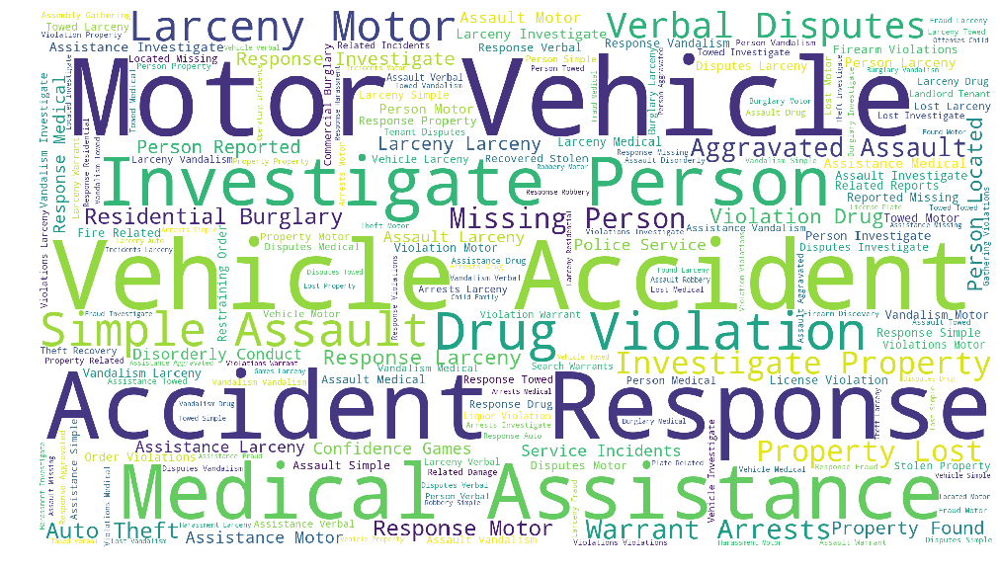

In [14]:
plt.figure(figsize=(20,10))
wordcloud = WordCloud(
                          background_color='white',
                          width=1920,
                          height=1080
                         ).generate(" ".join(df.OFFENSE_CODE_GROUP))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('graph.png')
plt.show()

# Thank You
If you have any suggestion or advice or feedback, I will be very appreciated to hear them.
#### Also there are other visualization kernels
* [FIFA Data Analysis and Visualization](https://www.kaggle.com/ismailsefa/f-fa-19-player-data-analys-s-and-visualization#FIFA-Data-Analysis-and-Visualization)


